In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from skimage import io
%matplotlib inline
import tqdm
import torchvision
import torch

In [2]:
def get_delta_kroneker(i,j):
    if (i[0] != j[0]) | (i[1] != j[1]):
        return 0
    return 1

def get_all_mean_vectors(img, omega):
    MEANS = [[None] * (img.shape[1] - omega[1] + 1)] * (img.shape[0] - omega[0] + 1)
    for coord1 in range(img.shape[0] - omega[0] + 1):
        for coord2 in range(img.shape[1] - omega[1] + 1):
            MEANS[coord1][coord2] = get_mean_vector(img[coord1:coord1 + omega[0], coord2:coord2 + omega[1]])
    return np.array(MEANS)
            

def get_all_covariance_matrix_adv(img, mean_vectors, omega, eps):
    COV_MATRIX = [[None] * (img.shape[1] - omega[1] + 1)] * (img.shape[0] - omega[0] + 1)
    for coord1 in range(img.shape[0] - omega[0] + 1):
        for coord2 in range(img.shape[1] - omega[1] + 1):
            tmp = get_covariance_matrix(img[coord1:coord1 + omega[0], coord2:coord2 + omega[1]],\
                                        mean_vectors[coord1, coord2])
            COV_MATRIX[coord1][coord2] = np.linalg.inv(tmp + eps/(omega[0]*omega[1])*np.eye(3))
    return np.array(COV_MATRIX)

def get_mean_vector(box):
    mean_vector = []
    for channel in range(box.shape[2]):
        mean_vector.append(box[:, :, channel].mean())
    return mean_vector

def get_covariance_matrix(box, mean_vector):
    cov_matrix = np.zeros((box.shape[2], box.shape[2]))
    for channel1 in range(box.shape[2]):
        for channel2 in range(box.shape[2]):
            for i in range(box.shape[0]):
                for j in range(box.shape[1]):
                    cov_matrix[channel1, channel2] += (box[i,j, channel1] - mean_vector[channel1])*\
                    (box[i, j, channel2] - mean_vector[channel2])
            cov_matrix[channel1, channel2] /= (box.shape[0] * box.shape[1] - 1)
    return cov_matrix

def in_the_box(coord, i, j, omega):
    if (i[0] >= coord[0]) & (i[0] < coord[0] + omega[0]) & (i[1] >= coord[1]) & (i[1] < coord[1] + omega[1]) &\
            (j[0] >= coord[0]) & (j[0] < coord[0] + omega[0]) & (j[1] >= coord[1]) & (j[1] < coord[1] + omega[1]):
        return True
    return False

def get_ij_element_of_laplassian(img, i, j, MEANS, COV_MATRIX, omega, eps):
    elem = 0
    for coord1 in range(img.shape[0] - omega[0] + 1):
        for coord2 in range(img.shape[1] - omega[1] + 1):
            if in_the_box([coord1, coord2], i , j, omega):
                delta = get_delta_kroneker(i, j)
                elem += delta - 1/(omega[0] * omega[1]) * (1 + np.dot(np.dot(img[i[0], i[1]] - \
                    MEANS[coord1, coord2],COV_MATRIX[coord1, coord2]), img[j[0], j[1]] - MEANS[coord1, coord2]))
    return elem

def get_laplassian(img, omega = (3,3), eps=0, block_size=10):
    laplassian = np.zeros((img.shape[0] * img.shape[1], img.shape[0] * img.shape[1]))
    MEANS = get_all_mean_vectors(img, omega)
    COV_MATRIX = get_all_covariance_matrix_adv(img, MEANS, omega, eps)
    for block_x in range(img.shape[0]//block_size):
        for block_y in tqdm.tqdm_notebook(range(img.shape[1]//block_size)):
            for ii1 in range(10*block_x, 10*block_x+10):
                for ii2 in range(10*block_y, 10*block_y+10):
                    for jj1 in range(10*block_x, 10*block_x+10):
                        for jj2 in range(10*block_y, 10*block_y+10):
                            laplassian[ii1*img.shape[1]+ii2, jj1*img.shape[1]+jj2] =\
                                            get_ij_element_of_laplassian(img[10*block_x:10*block_x+10,\
                                                10*block_y:10*block_y+10, :], [ii1 % 10, ii2%10], [jj1%10, jj2%10],\
                                                MEANS[10*block_x:10*block_x+10, 10*block_y:10*block_y+10, :], \
                                                COV_MATRIX[10*block_x:10*block_x+10, 10*block_y:10*block_y+10, :], omega, eps)
#     MEANS = get_all_mean_vectors(img, omega)
#     print('Got all means')
#     COV_MATRIX = get_all_covariance_matrix_adv(img, MEANS, omega, eps)
#     print('Got all covariance matrices')
#     laplassian = np.zeros((img.shape[0] * img.shape[1], img.shape[0] * img.shape[1]))
#     for i1 in range(img.shape[0]):
#         for i2 in range(img.shape[1]):
#             for j1 in range(img.shape[0]):
#                 for j2 in tqdm.tqdm_notebook(range(img.shape[1])):
#                     laplassian[i1*img.shape[1] + i2, j1*img.shape[1] + j2] = get_ij_element_of_laplassian(img, [i1, i2],\
#                                                                         [j1, j2], MEANS, COV_MATRIX, omega, eps)
    return np.array(laplassian)

In [31]:
class Antihaze:
    def __init__(self, image, patch_size=(15,15), omega=0.95, t_0=0.1, percent=0.1, lamb = 1e-4,\
                                                 omega_box = (3,3), mode='normal', eps = 1e-4, mode_atm = 'max'):
        assert((patch_size[0] % 2 == 1) & (patch_size[1] % 2 == 1))
        if type(image) == str:
            self.img = io.imread(image)
            self.img = self.img[:(self.img.shape[0] - self.img.shape[0]%10),\
                                :(self.img.shape[1] - self.img.shape[1]%10), :]
        else:
            self.img = image
        self.patch_size = patch_size
        self.omega = omega
        self.t_0 = t_0
        self.percent = percent
        self.lamb = lamb
        self.omega_box = omega_box
        self.mode = mode
        self.eps = eps
        self.mode_atm = mode_atm
        
    def img_visiualize(self):
        plt.imshow(self.img)
    
    def img_to_array(self):
        return self.img.reshape((1, -1))
    
    def get_dark_channel(self):
        new_img = np.ones((self.img.shape[0] + self.patch_size[0] - 1, self.img.shape[1] +\
                           self.patch_size[1] - 1, self.img.shape[2]))
        add_x = int((self.patch_size[0] - 1) / 2)
        add_y = int((self.patch_size[1] - 1) / 2)
        new_img[add_x:-add_x, add_y:-add_y:] = self.img
        dark_channel = np.zeros((self.img.shape[0], self.img.shape[1]))
        for x in range(dark_channel.shape[0]):
            for y in range(dark_channel.shape[1]):
                dark_channel[x, y] = self.img[x:x+self.patch_size[0], y:y+self.patch_size[1], :].min()
        return dark_channel
    
    def dark_channel_visualize(self):
        plt.figure(figsize=(16, 8))
        plt.subplot(121)
        plt.imshow(self.img)
        plt.subplot(122)
        plt.imshow(self.dark_channel, cmap='Greys_r')
        
    def mark_top_k_percent_pixels(self):
        brightest_pixels = []
        img_vector = self.dark_channel.reshape(1, -1).squeeze()
        min_value = sorted(img_vector, reverse=True)[:int(0.01 * self.percent * len(img_vector))][-1]
        for x in range(self.dark_channel.shape[0]):
            for y in range(self.dark_channel.shape[1]):
                if self.dark_channel[x, y] >= min_value:
                    brightest_pixels.append((x, y))
        brightest_pixels = np.array(brightest_pixels)
#         plt.figure(figsize=(8,8))
#         plt.imshow(self.dark_channel, cmap='Greys_r')
#         plt.scatter(brightest_pixels[:, 1], brightest_pixels[:, 0], marker='.', edgecolors='r', linewidths=0.3)
        return brightest_pixels
    
    def get_atmospheric_light(self, mode_atm='max'):
        brightest_pixels = self.mark_top_k_percent_pixels()
        max_val = [0] * self.img.shape[2]
        if mode_atm == 'max':
            for pixel_x, pixel_y in brightest_pixels:
                for channel in range(self.img.shape[2]):
                    loc_max = self.img[pixel_x, pixel_y, channel]
                    if loc_max > max_val[channel]:
                        max_val[channel] = loc_max
        if mode_atm == 'avg':
            for pixel_x, pixel_y in brightest_pixels:
                for channel in range(self.img.shape[2]):
                    loc_max = self.img[pixel_x, pixel_y, channel]
                    max_val[channel] += loc_max
            for channel in range(self.img.shape[2]):
                max_val[channel] = int(max_val[channel]/len(brightest_pixels))
        return max_val#, np.array(pixel_val)

    def get_transmission_map(self):
        new_img = np.ones((self.img.shape[0] + self.patch_size[0] - 1, self.img.shape[1] +\
                                                           self.patch_size[1] - 1, self.img.shape[2]))
        add_x = int((self.patch_size[0] - 1) / 2)
        add_y = int((self.patch_size[1] - 1) / 2)
        new_img[add_x:-add_x, add_y:-add_y:] = self.img
        transmission_map = np.zeros((self.img.shape[0], self.img.shape[1]))
        for x in range(transmission_map.shape[0]):
            for y in range(transmission_map.shape[1]):
                temp_channel = []
                for channel in range(self.img.shape[2]):
                    temp = self.img[x: x+self.patch_size[0], y:y+self.patch_size[1], channel] /\
                                                                                    self.atmosphere[channel]
                    temp_channel.append(temp.min())
                transmission_map[x, y] = 1 - self.omega * min(temp_channel)
    
        if self.mode == 'advanced':
            laplassian = get_laplassian(self.img, self.omega_box, self.eps)
            print('Got laplassian')
            print(laplassian.shape, transmission_map.reshape((1, -1)).squeeze().shape)
            advanced_transmission_map = np.linalg.solve(laplassian + self.lamb * np.eye(laplassian.shape[0]),\
                            transmission_map.reshape((1, -1)).squeeze()).reshape((transmission_map.shape[0], 0))
            return advanced_transmission_map
            
        return transmission_map
    
    def show_depth_map(self):
        depth_map = -np.log(self.transmission)
        plt.imshow(depth_map, cmap='inferno_r')
    
    def get_scene_radiance(self):
        a = True
        scene_radiance = np.uint16(np.zeros_like(self.img))
        for x in range(self.img.shape[0]):
            for y in range(self.img.shape[1]): 
                scene_radiance[x, y] = (np.array(list(map(int, self.img[x, y]))) - np.array(list(map(int, self.atmosphere)))) / max([self.t_0, \
                                                                self.transmission[x, y]]) + np.array(list(map(int, self.atmosphere)))
                for channel in range(self.img.shape[2]):
                    if scene_radiance[x, y, channel] > 255:
                        scene_radiance[x, y, channel] = 255
        return scene_radiance
    
    def show(self):
        plt.figure(figsize=(16, 8))
        plt.subplot(121)
        plt.imshow(self.img)
        plt.subplot(122)
        plt.imshow(self.scene_radiance, cmap='Greys_r')
        
    def show_trans_map(self) :
        plt.imshow(self.transmission, cmap='Greys_r')
        
    def print_all(self):
        print("DARK CHANNEL:")
        plt.figure(figsize=(8, 8))
        plt.imshow(self.dark_channel, cmap = 'Greys_r')
        print("TRANSMISSION MAP:")
        plt.figure(figsize=(8, 8))
        plt.imshow(self.transmission, cmap='Greys_r')
        print("SCENE_RADIANCE:")
        plt.figure(figsize=(8, 8))
        plt.imshow(self.scene_radiance)
        
    def run(self):
        self.dark_channel = self.get_dark_channel()
        #print('Dark channel done')
        self.atmosphere = self.get_atmospheric_light()
        #print('Atmosphere done')
        self.transmission = self.get_transmission_map()
        #print('Transmission done')
        self.scene_radiance = self.get_scene_radiance()
        self.show()

In [259]:
a = 256
np.uint8(a)

0

# Dark channel

In [257]:
img0 = Antihaze('1504605947158114655.jpg')
img0.run()

FileNotFoundError: [Errno 2] No such file or directory: '1504605947158114655.jpg'

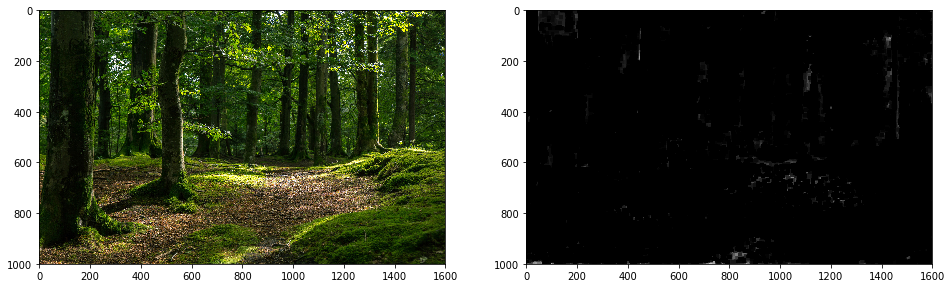

In [75]:
img0.dark_channel_visualize()

Dark channel done
Atmosphere done
Transmission done


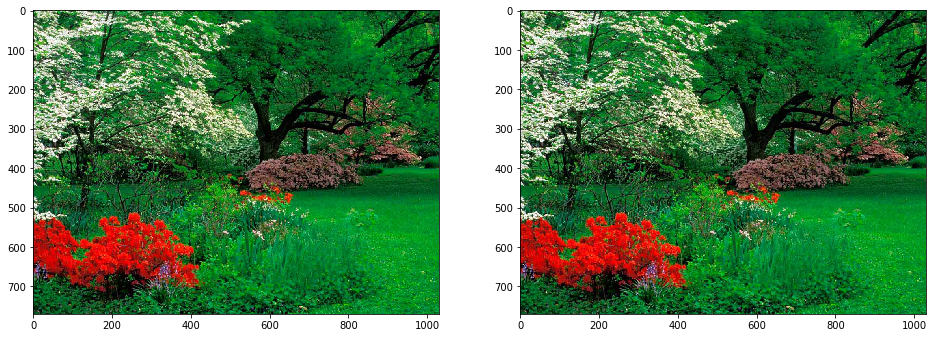

In [78]:
img1 = Antihaze('for_dark_channel_1.jpg')
img1.run()

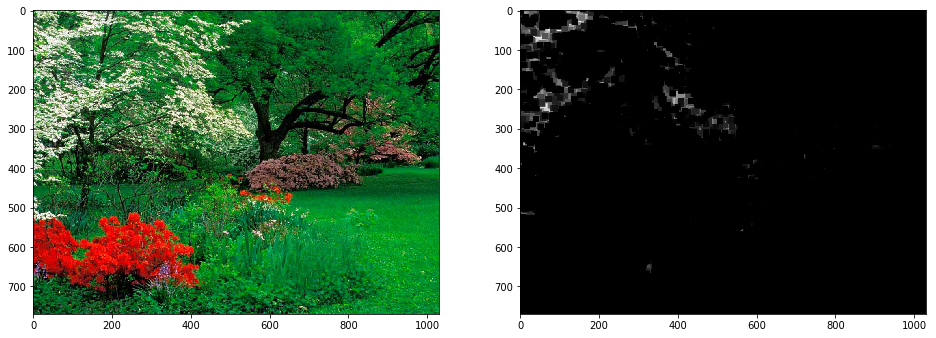

In [79]:
img1.dark_channel_visualize()

Dark channel done
Atmosphere done
Transmission done


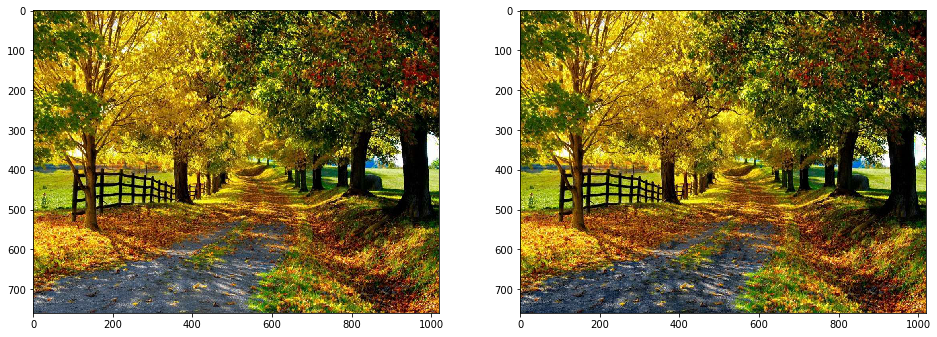

In [62]:
img2 = Antihaze('for_dark_channel_2.jpg', patch_size=(15,15), omega=0.9, mode_atm='avg')
img2.run()

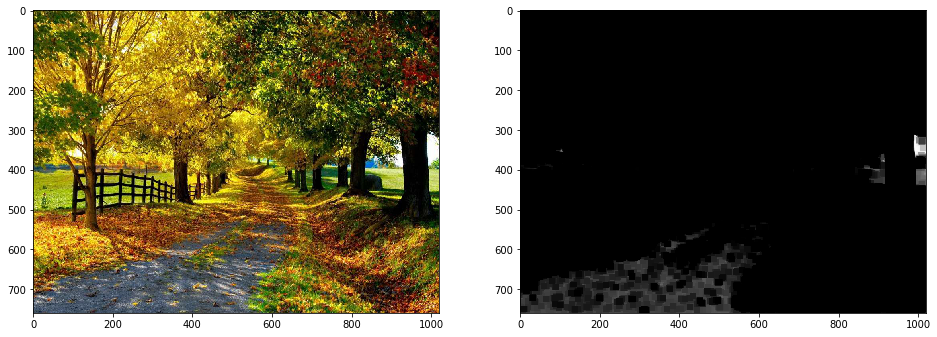

In [63]:
img2.dark_channel_visualize()

In [119]:
img3 = Antihaze('for_dark_channel_3.jpg', patch_size=(21,21), omega=0.9, mode_atm='avg')
img3.dark_channel = img3.get_dark_channel()

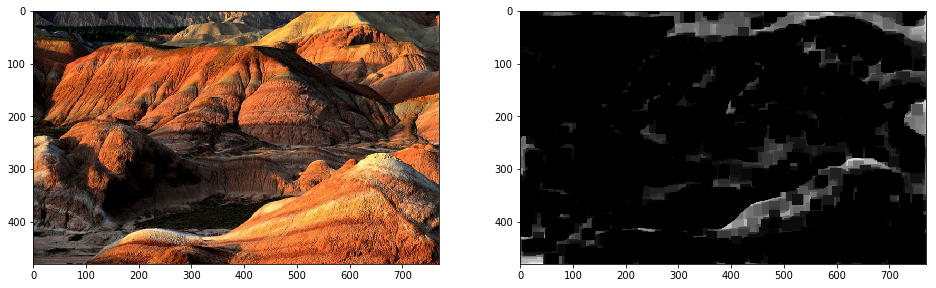

In [120]:
img3.dark_channel_visualize()

Dark channel done
Atmosphere done
Transmission done


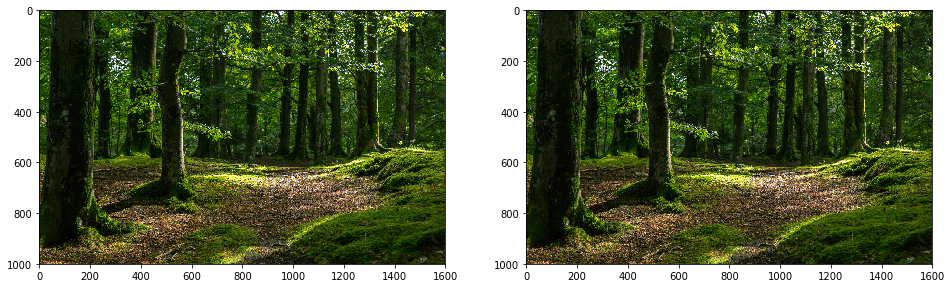

In [166]:
img1.run()

In [22]:
img2.img.shape

(190, 250, 3)

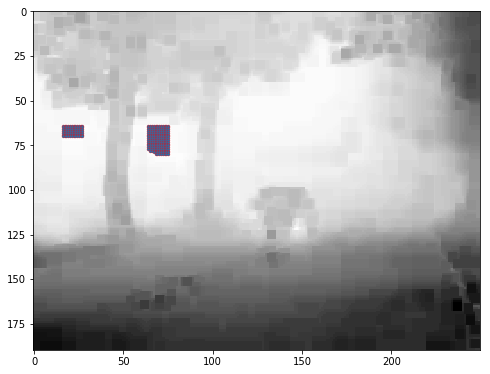

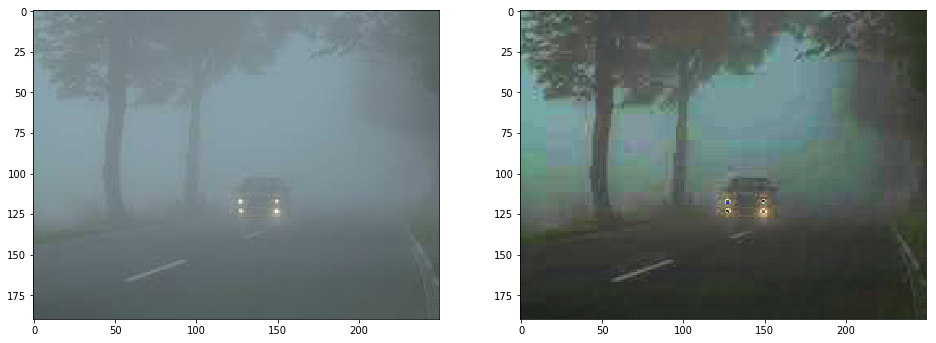

In [169]:
img6 = Antihaze('Unknown.jpg', mode_atm='avg', patch_size=(5,5), omega=0.8)
img6.run()

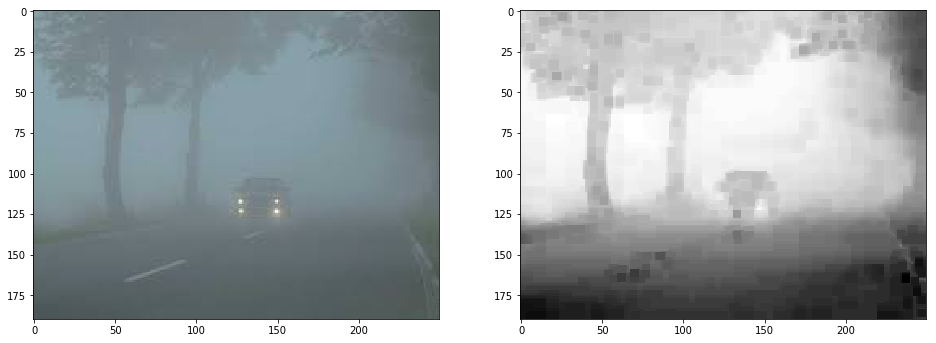

In [168]:
img6.dark_channel_visualize()

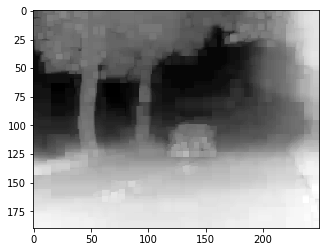

In [174]:
img6.show_trans_map()

In [7]:
# plt.figure(figsize=(16, 8))
# plt.subplot(121)
# plt.imshow(img2.img[:, :, 0], cmap='Greys_r')
# plt.subplot(122)
# plt.imshow(img2.scene_radiance[:, :, 0], cmap='Greys_r')

# plt.figure(figsize=(16, 8))
# plt.subplot(121)
# plt.imshow(img2.img[:, :, 1], cmap='Greys_r')
# plt.subplot(122)
# plt.imshow(img2.scene_radiance[:, :, 1], cmap='Greys_r')

# plt.figure(figsize=(16, 8))
# plt.subplot(121)
# plt.imshow(img2.img[:, :, 2], cmap='Greys_r')
# plt.subplot(122)
# plt.imshow(img2.scene_radiance[:, :, 2], cmap='Greys_r')

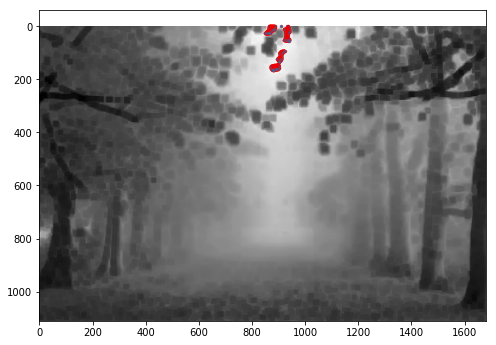

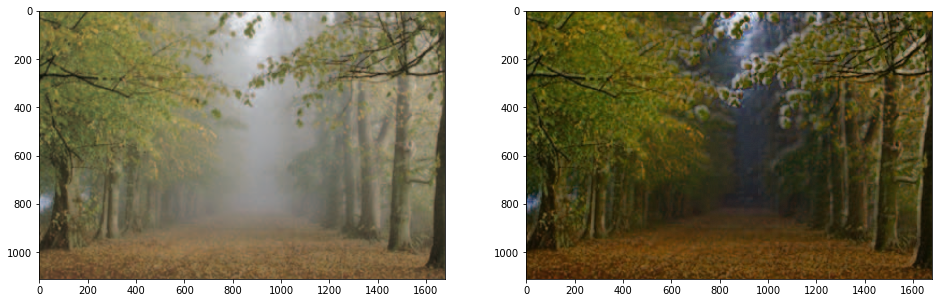

In [176]:
img7 = Antihaze('Снимок экрана 2019-04-16 в 18.19.14.png', patch_size=(15,15), omega=0.9, t_0= 0, mode_atm='avg')
img7.run()

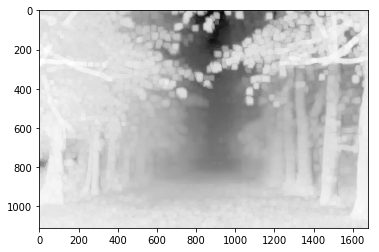

In [154]:
img7.show_trans_map()

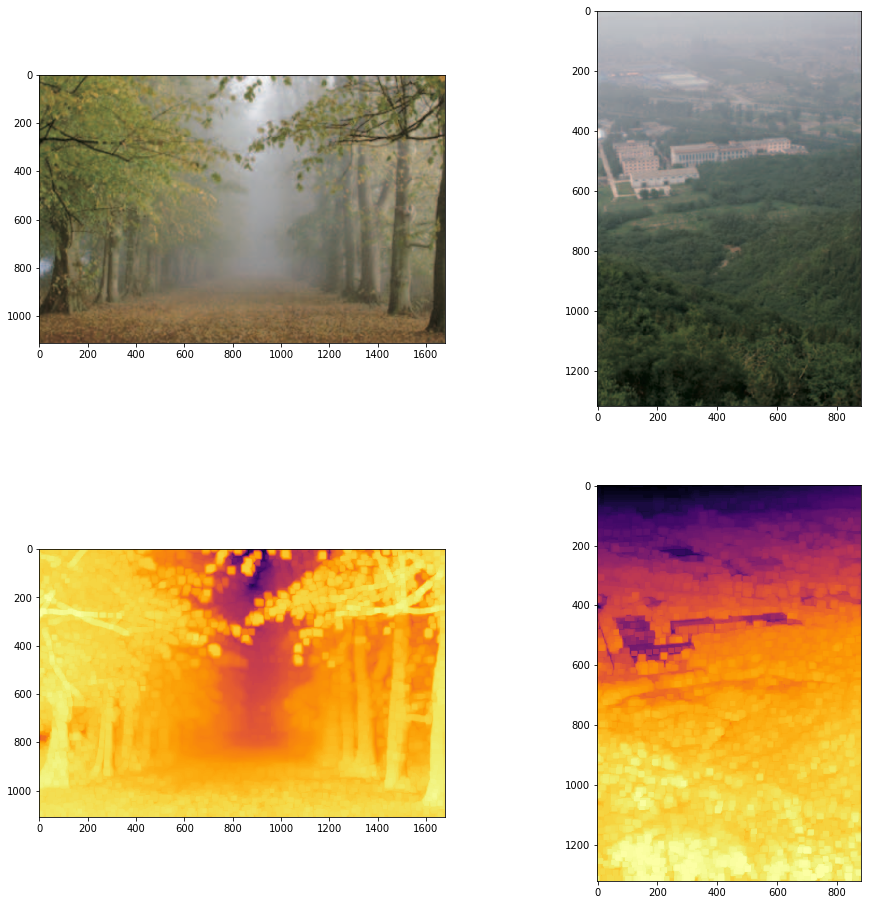

In [166]:
plt.figure(figsize=(16, 16))
plt.subplot(221)
plt.imshow(img7.img)
plt.subplot(222)
plt.imshow(img8.img)
plt.subplot(223)
img7.show_depth_map()
plt.subplot(224)
img8.show_depth_map()

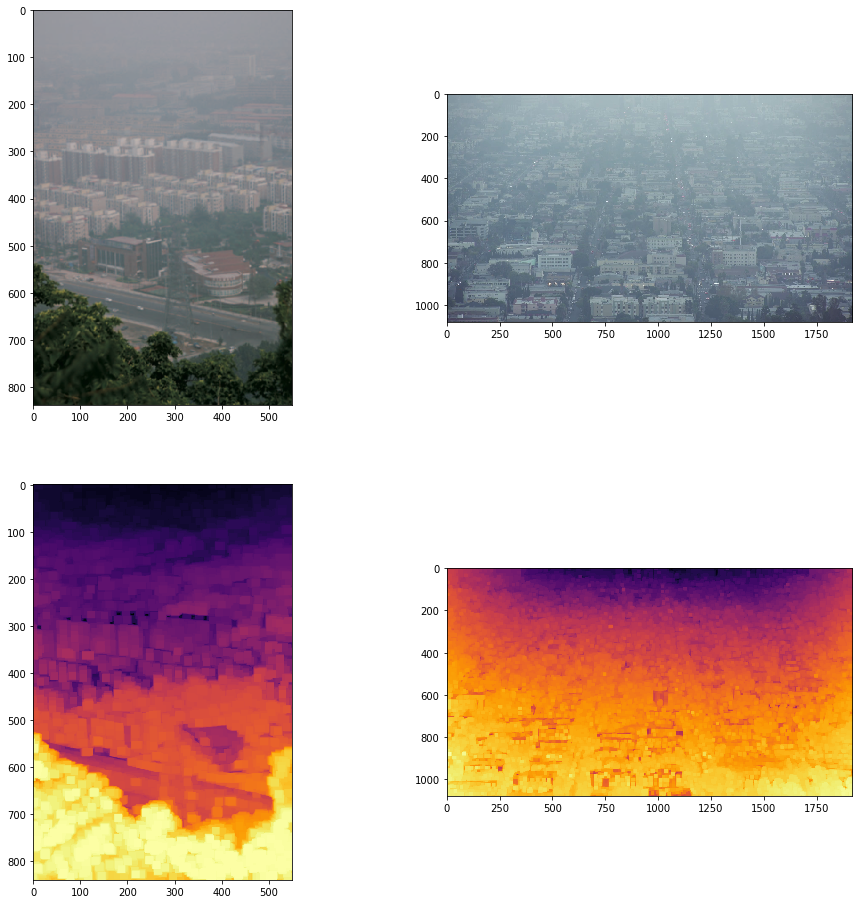

In [167]:
plt.figure(figsize=(16, 16))
plt.subplot(221)
plt.imshow(img9.img)
plt.subplot(222)
plt.imshow(img10.img)
plt.subplot(223)
img9.show_depth_map()
plt.subplot(224)
img10.show_depth_map()

In [ ]:
img9.da

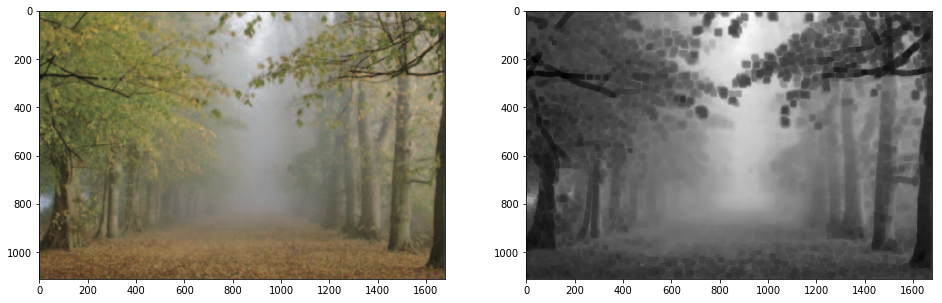

In [91]:
img7.dark_channel_visualize()

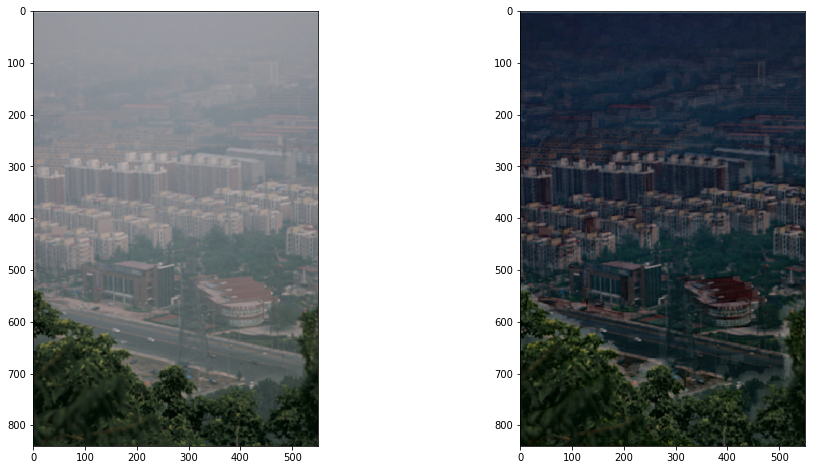

In [57]:
img9_15 = Antihaze('haze1.png',patch_size=(15,15))
img9_15.run()

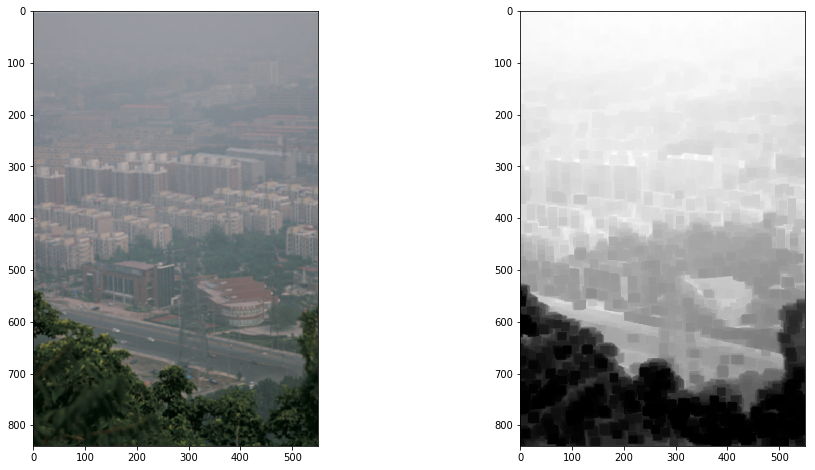

In [58]:
img9_15_15.dark_channel_visualize()

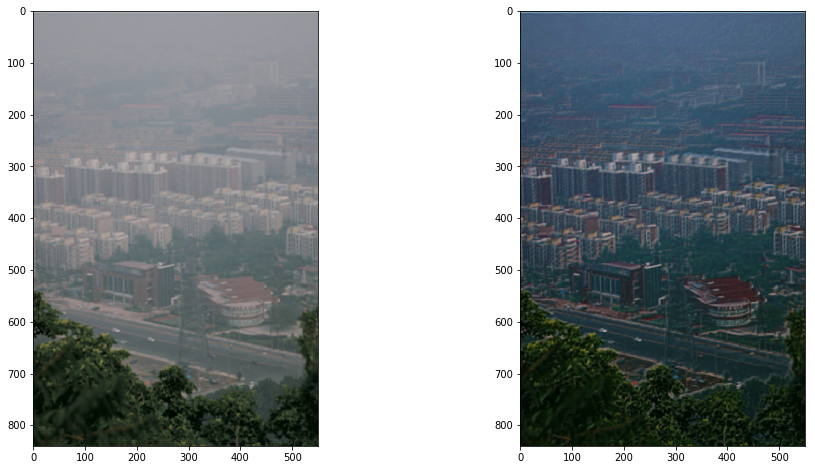

In [198]:
img9_7 = Antihaze('haze1.png',patch_size=(5,5), omega=0.85)
img9_7.run()

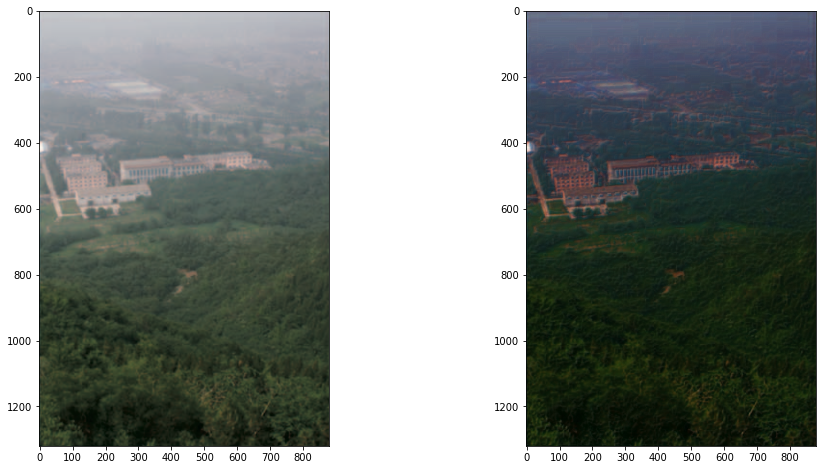

In [201]:
img8 = Antihaze('haze2.png', patch_size=(5,5), omega=0.8)
img8.run()

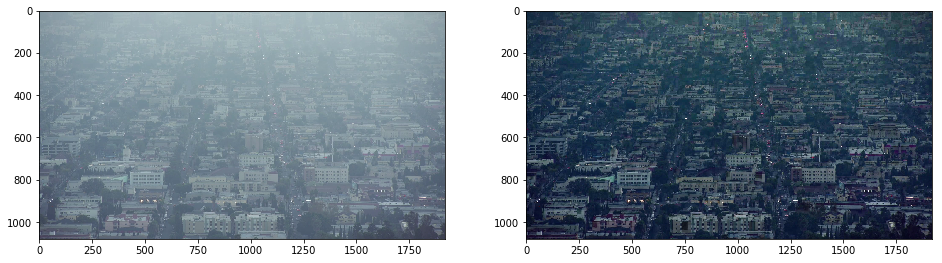

In [59]:
img10 = Antihaze('haze3.png', patch_size=(15,15), omega=0.95)
img10.run()

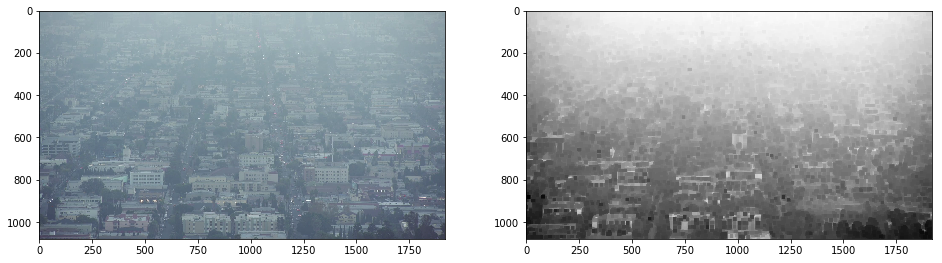

In [60]:
img10.dark_channel_visualize()

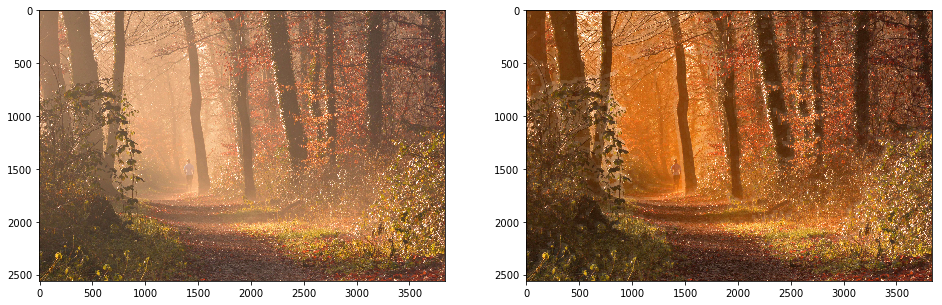

In [211]:
img10 = Antihaze('img4.jpg', patch_size=(31,31))
img10.run()

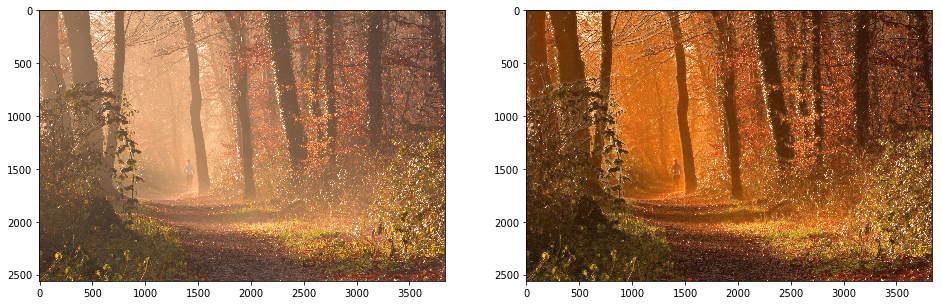

In [212]:
img11 = Antihaze('img4.jpg')
img11.run()

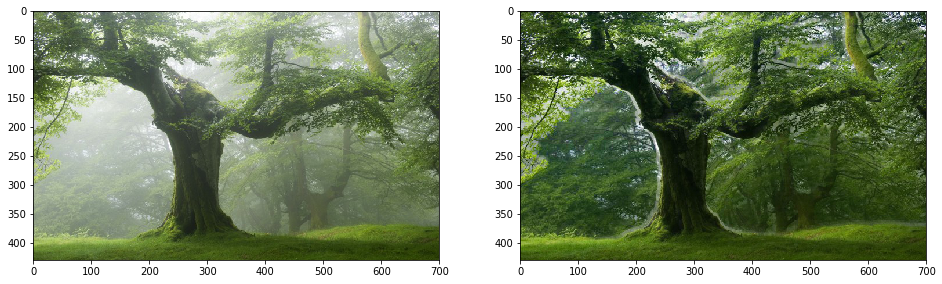

In [216]:
img12 = Antihaze('haze5.jpg', patch_size=(7,7))
img12.run()

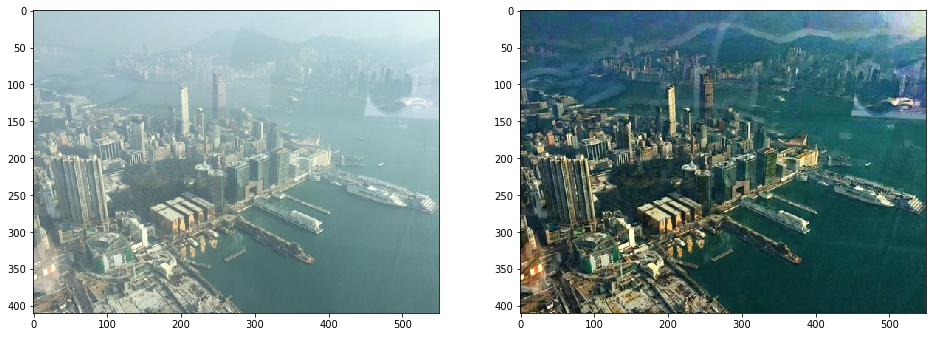

In [33]:
img12 = Antihaze('haze6.jpg', patch_size=(9,9))
img12.run()

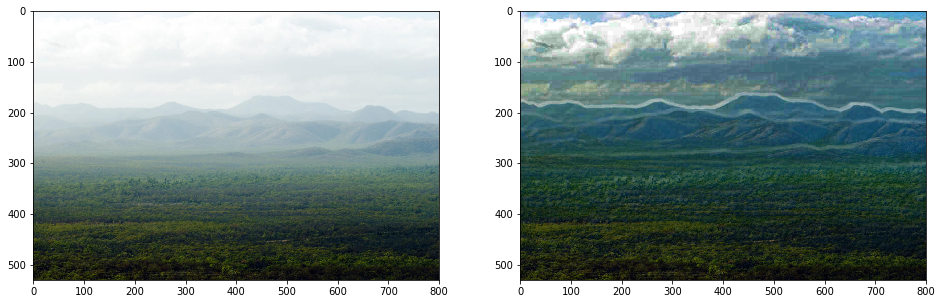

In [46]:
img12 = Antihaze('haze8.jpg', patch_size=(7,7))
img12.run()

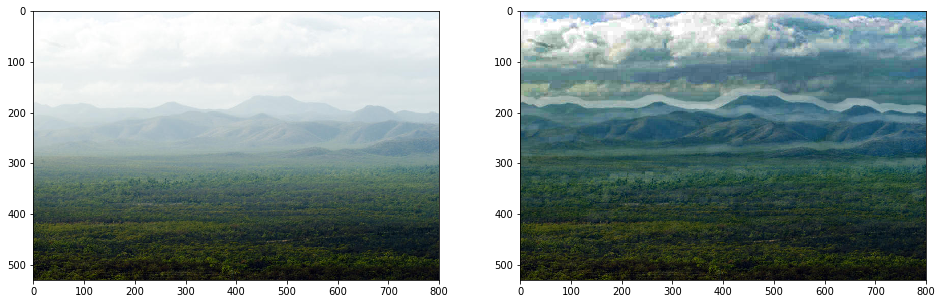

In [42]:
img12_15 = Antihaze('haze8.jpg', patch_size=(15,15))
img12_15.run()

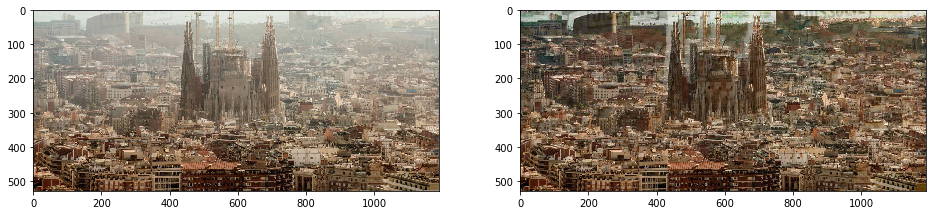

In [55]:
img12 = Antihaze('haze9.jpg')
img12.run()

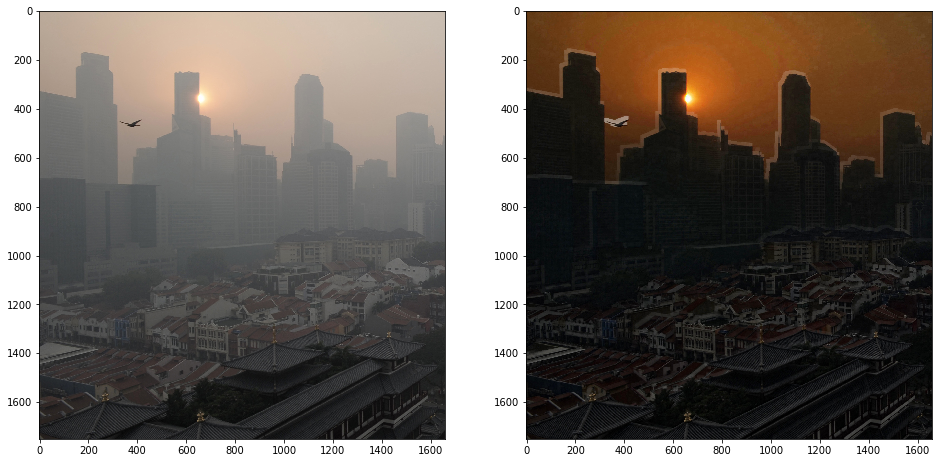

In [62]:
img12 = Antihaze('haze10.jpg')
img12.run()

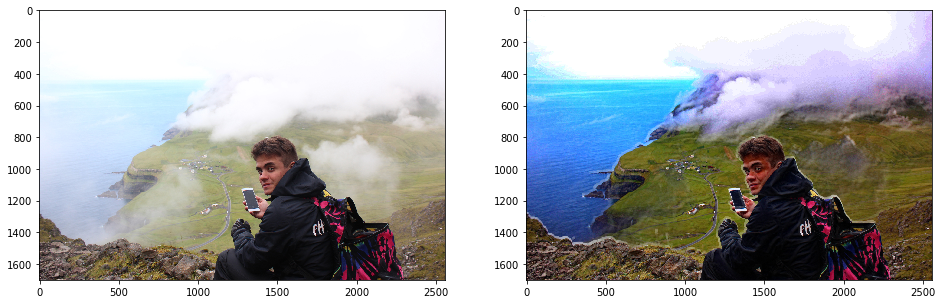

In [56]:
imgb = Antihaze('borz.jpg')
imgb.run()

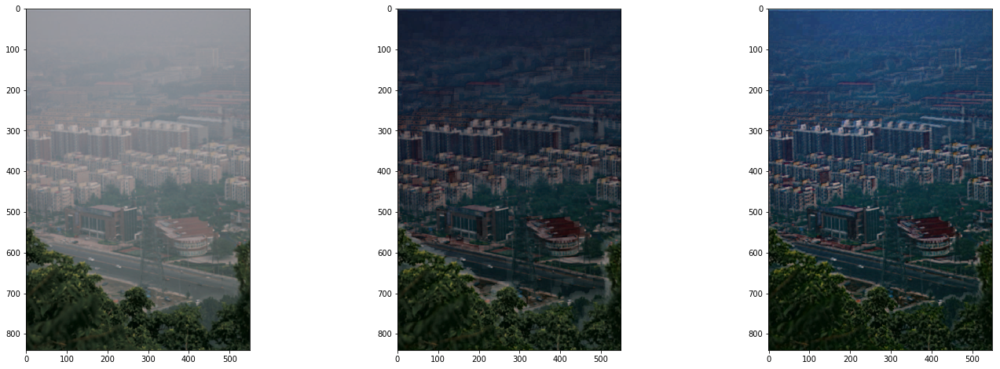

In [192]:
plt.figure(figsize=(24, 8))
plt.subplot(131);plt.imshow(img9_15.img)
plt.subplot(132);plt.imshow(img9_15.scene_radiance)
plt.subplot(133);plt.imshow(img9_7.scene_radiance)
plt.show()

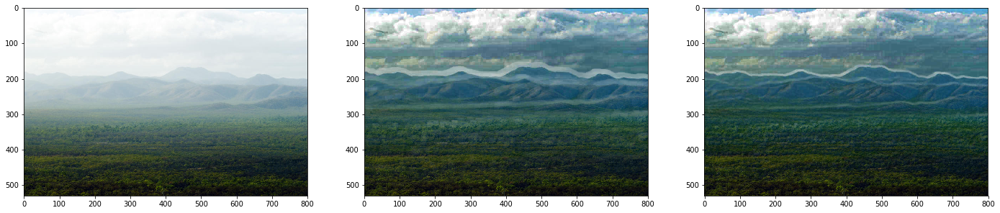

In [47]:
plt.figure(figsize=(24, 8))
plt.subplot(131);plt.imshow(img12_15.img)
plt.subplot(132);plt.imshow(img12_15.scene_radiance)
plt.subplot(133);plt.imshow(img12.scene_radiance)
plt.show()

Dark channel done
Atmosphere done
Transmission done
CPU times: user 1min 9s, sys: 1.04 s, total: 1min 10s
Wall time: 1min 9s


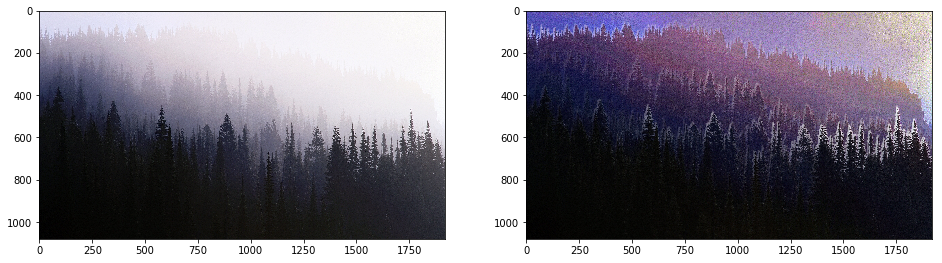

In [42]:
%%time
img3 = Antihaze('236779.jpg', patch_size=(7,7), mode_atm='avg')
img3.run()

DARK CHANNEL:
TRANSMISSION MAP:
SCENE_RADIANCE:


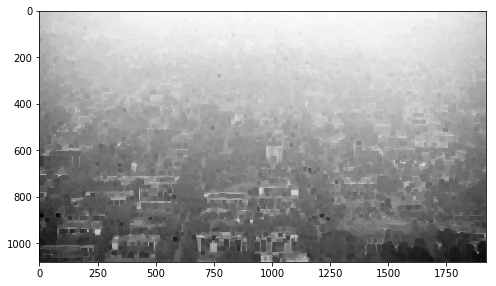

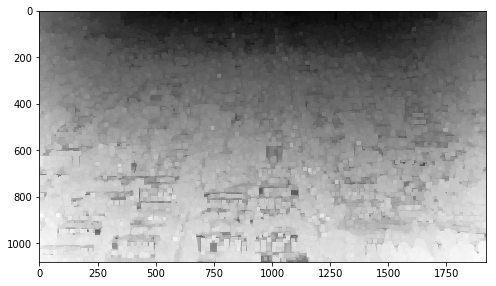

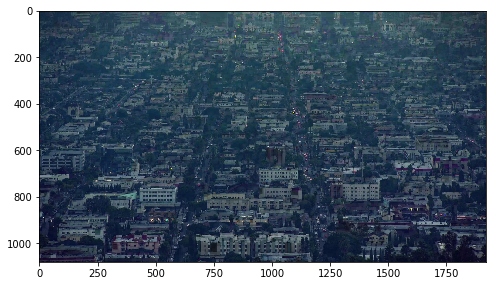

In [177]:
img10.print_all()

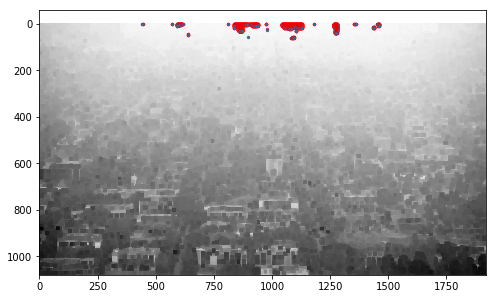

In [135]:
_ = img8.mark_top_k_percent_pixels()

Dark channel done
Atmosphere done
Transmission done


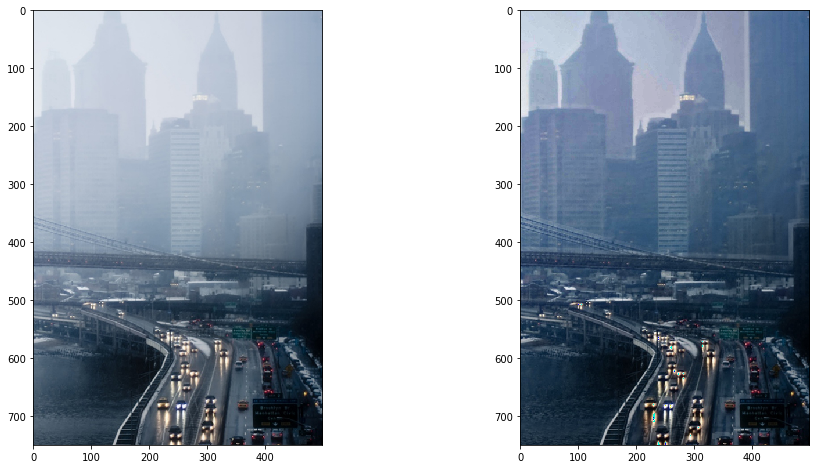

In [10]:
img9 = Antihaze('394765963843851eb556a9d527fc3a88.png', patch_size=(9,9), omega=0.8)
img9.run()

DARK CHANNEL:
TRANSMISSION MAP:
SCENE_RADIANCE:


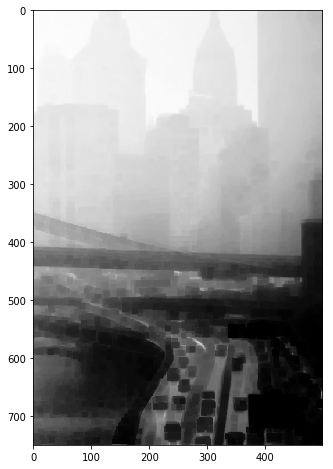

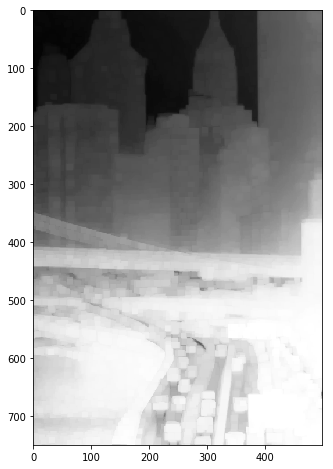

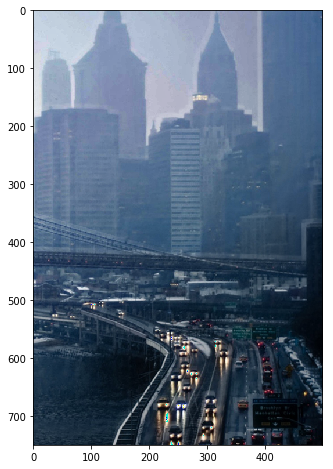

In [11]:
img9.print_all()

In [29]:
img = Antihaze('low.png', mode='advanced')
img.img.shape
img.run()

Dark channel done
Atmosphere done


ValueError: operands could not be broadcast together with shapes (4,4) (3,3) 

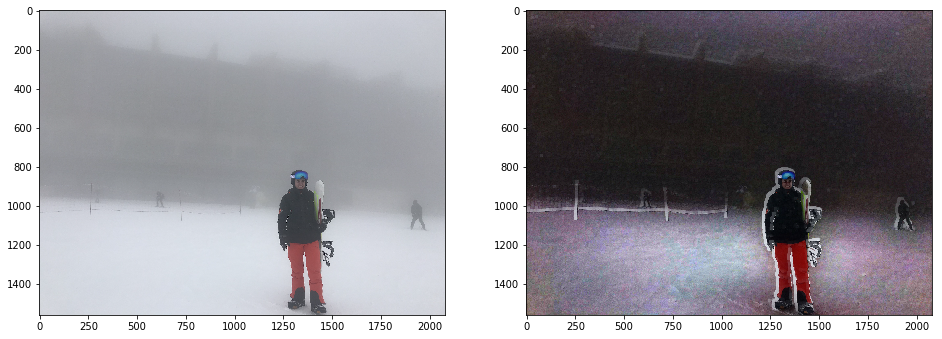

In [63]:
img = Antihaze('fail.png')
img.run()